In [2]:
'''
# ДОБАВЬТЕ В НАЧАЛО:
from tensorflow.keras import mixed_precision
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)
'''

In [2]:
# Оптимизация TensorFlow
import tensorflow as tf
tf.config.optimizer.set_jit(True)  # Включение XLA-компиляции
tf.config.threading.set_intra_op_parallelism_threads(8)
#tf.config.threading.set_inter_op_parallelism_threads(8)

# Для GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
            #tf.config.experimental.set_memory_limit(gpu, 8192)  # Лимит 8GB
    except RuntimeError as e:
        print(e)

In [ ]:
#!pip install tensorboard

In [3]:
#!pip install scikit-optimize -q

In [5]:
#!pip install optuna -q

In [6]:
#!pip install optuna-integration[tfkeras] -q

In [7]:
#!pip install optuna-dashboard -q

In [3]:
# переключиться на полуточную арифметику (float16)
import tensorflow as tf
from tensorflow.keras.mixed_precision import Policy
policy = Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)

In [5]:
!nvidia-smi

Sun Oct 19 18:48:29 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 575.64.01              Driver Version: 576.80         CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4070        On  |   00000000:01:00.0  On |                  N/A |
|  0%   42C    P8             12W /  200W |     851MiB /  12282MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
# Текущая директория + путь к датасету

import os
HOME = os.getcwd()
print(HOME)
print('-----------------------')
# Пути
IMAGE_PATH = "/home/oleg/projects/datasets/construction"
#dataset_path = "./animals"
#dataset_path = "./cars_pretrained"
#dataset_path = "./construction"
#IMAGE_PATH = dataset_path
os.listdir(IMAGE_PATH)

/home/oleg/projects/ML
-----------------------


['mining_loader',
 'bulldozer',
 'ice_rink',
 'dump_truck',
 'excavator',
 'person',
 'car',
 'truck_crane']

In [ ]:
# как скачать датасет с Kaggle
'''
import os
import kaggle
import zipfile

# Скачаем напрямую через Kaggle API в текущую папку
dataset_name = 'bhavikjikadara/dog-and-cat-classification-dataset'
download_path = './cats_dogs_data'

print("📥 Downloading dataset...")
kaggle.api.dataset_download_files(
    dataset_name, 
    path=download_path, 
    unzip=True  # Важно: распаковываем автоматически!
)
'''

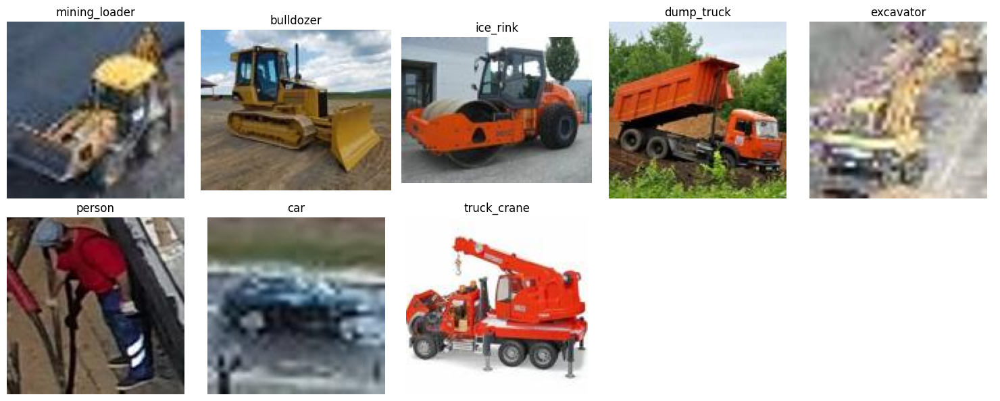

🎲 Показано по 1 случайному изображению из 8 категорий


In [8]:
# Показано по 1 случайному изображению из каждой категорий
from PIL import Image
import os
import matplotlib.pyplot as plt
import random

# Создаем график 2x5
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.ravel()

categories = os.listdir(IMAGE_PATH)
plot_index = 0

for category in categories:
    category_path = os.path.join(IMAGE_PATH, category)
    file_names = os.listdir(category_path)
    
    # Берем 1 случайное изображение из каждой категории
    if file_names:
        random_file = random.choice(file_names)
        img_path = os.path.join(category_path, random_file)
        img = Image.open(img_path)
        
        axes[plot_index].imshow(img)
        axes[plot_index].set_title(f"{category}", fontsize=12)
        axes[plot_index].axis('off')
        plot_index += 1

# Скрываем лишние subplot'ы
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"🎲 Показано по 1 случайному изображению из {plot_index} категорий")

📊 АНАЛИЗ ДАТАСЕТА:
  bulldozer: 194 файлов
  car: 1586 файлов
  dump_truck: 797 файлов
  excavator: 316 файлов
  ice_rink: 293 файлов
  mining_loader: 514 файлов
  person: 969 файлов
  truck_crane: 321 файлов
📈 ИТОГО: 4990 изображений, 8 классов


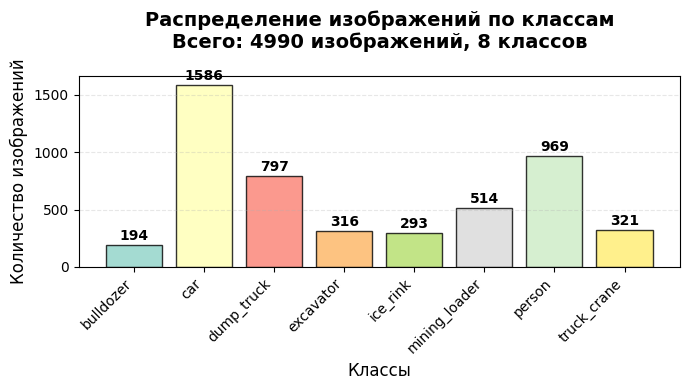

In [11]:
# Простой анализ датасета с визуализацией

import os
import matplotlib.pyplot as plt
import numpy as np

def analyze_dataset_simple(dataset_path):
    """
    Простой анализ датасета с визуализацией
    """
    # Проверяем существование пути
    if not os.path.exists(dataset_path):
        print(f"❌ Ошибка: путь '{dataset_path}' не существует")
        return None
    
    # Получаем список классов
    class_names = [d for d in os.listdir(dataset_path) 
                  if os.path.isdir(os.path.join(dataset_path, d))]
    class_names.sort()
    
    if not class_names:
        print("❌ В датасете не найдено папок с классами")
        return None
    
    # Подсчет файлов
    class_counts = {}
    total_files = 0
    
    print("📊 АНАЛИЗ ДАТАСЕТА:")
    for class_name in class_names:
        class_path = os.path.join(dataset_path, class_name)
        image_files = [f for f in os.listdir(class_path) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        count = len(image_files)
        class_counts[class_name] = count
        total_files += count
        print(f"  {class_name}: {count} файлов")
    
    print(f"📈 ИТОГО: {total_files} изображений, {len(class_names)} классов")
    
    # Визуализация
    plt.figure(figsize=(7, 4))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    # Создаем диаграмму
    bars = plt.bar(classes, counts, color=plt.cm.Set3(np.linspace(0, 1, len(classes))), 
                   edgecolor='black', alpha=0.8)
    
    # Настройки графика
    plt.title(f'Распределение изображений по классам\nВсего: {total_files} изображений, {len(class_names)} классов', 
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Классы', fontsize=12)
    plt.ylabel('Количество изображений', fontsize=12)
    
    # Поворачиваем подписи и выравниваем
    plt.xticks(rotation=45, ha='right')
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + max(counts)*0.01,
                f'{count}', ha='center', va='bottom', fontweight='bold', fontsize=10)
    
    # Добавляем сетку для удобства чтения
    plt.grid(True, axis='y', alpha=0.3, linestyle='--')
    
    # Настраиваем отступы
    plt.tight_layout()
    
    plt.show()
    
    return {'class_names': class_names, 'class_counts': class_counts, 'total_files': total_files}

# ИСПОЛЬЗОВАНИЕ:
# Просто вызовите функцию с путем к вашему датасету
result = analyze_dataset_simple(IMAGE_PATH)

In [ ]:
!pip install optuna

In [5]:
# МЕТКИ INTEGER

# САМЫЙ ПРОСТОЙ ВАРИАНТ - integer labels

import tensorflow as tf

#from tensorflow.keras.applications.resnet50 import preprocess_input        # импорт для resnet50
from tensorflow.keras.applications.efficientnet import preprocess_input     # импорт для efficientnet
#from tensorflow.keras.applications.efficientnet_v2 import preprocess_input

import numpy as np
import matplotlib.pyplot as plt

height, width = 224, 224
batch_size=32

print("🔄 СОЗДАЕМ ПАЙПЛАЙН...")

# Загрузка данных (хорошо!)
train_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='training',
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

validation_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='validation', 
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

# Проверка формата (хорошо!)
images, labels = next(iter(train_data_raw))
print(f"Labels shape: {labels.shape}")  # (32,) - integer
print(f"Labels: {labels.numpy()[:15]}")  # [0, 1, 0, 2, 1]

class_names = train_data_raw.class_names
num_classes = len(class_names)
print(f"🏷️ Классы: {class_names}")

# Аугментация (хорошо!)
data_augmentation = tf.keras.Sequential([
    # ГЕОМЕТРИЧЕСКИЕ ТРАНСФОРМАЦИИ
    tf.keras.layers.RandomFlip("horizontal"),
    #f.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2), # увеличить угол
    tf.keras.layers.RandomZoom(0.2), # увеличить зум
    #tf.keras.layers.RandomTranslation(0.2, 0.2),  # сдвиг по X и Y
    # ЦВЕТОВЫЕ ТРАНСФОРМАЦИИ  
    tf.keras.layers.RandomContrast(0.2),
    tf.keras.layers.RandomBrightness(0.2),
    # ШУМЫ И ИСКАЖЕНИЯ
    #tf.keras.layers.GaussianNoise(0.1),
    
    
])

#print("🔧 СОЗДАЕМ ПРОСТОЙ ПАЙПЛАЙН...")

'''
# Проепроцессин для RESNET
def preprocess_and_augment(image, label, training=False):
    """Preprocess + аугментация если training=True"""
    image = preprocess_input(tf.cast(image, tf.float32))
    if training:
        image = data_augmentation(image, training=True)
    return image, label
'''


# Проепроцессин для EfficientNet
def preprocess_and_augment(image, label, training=False):
    """Правильный препроцессинг для EfficientNet"""
    image = tf.cast(image, tf.float32)
    #image = preprocess_input(image)  # ✅ Должен нормализовать в [0, 1] или [-1, 1]
    if training:
        image = data_augmentation(image, training=True)
    return image, label

# Финальные datasets
train_data = (
    train_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=True),
         num_parallel_calls=tf.data.AUTOTUNE)
    .cache()  # ✅ ДОБАВИТЬ: кэширование ускорит обучение    
    .prefetch(tf.data.AUTOTUNE)
)

validation_data = (
    validation_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=False), 
         num_parallel_calls=tf.data.AUTOTUNE)
    .cache()  # ✅ ДОБАВИТЬ: кэширование ускорит обучение    
    .prefetch(tf.data.AUTOTUNE)
)

# Убедимся что препроцессинг работает правильно
print("🔍 Проверка препроцессинга:")
for images, labels in train_data.take(1):
    print(f"Shape: {images.shape}")
    print(f"Data range: {tf.reduce_min(images):.3f} to {tf.reduce_max(images):.3f}")
    print(f"Mean: {tf.reduce_mean(images):.3f}")
    break

print("✅ Пайплайн создан!")

🔄 СОЗДАЕМ ПАЙПЛАЙН...
Found 4990 files belonging to 8 classes.
Using 3992 files for training.
Found 4990 files belonging to 8 classes.
Using 998 files for validation.
Labels shape: (32,)
Labels: [0 5 1 5 5 6 2 6 6 0 1 6 3 1 7]
🏷️ Классы: ['bulldozer', 'car', 'dump_truck', 'excavator', 'ice_rink', 'mining_loader', 'person', 'truck_crane']
🔍 Проверка препроцессинга:
Shape: (32, 224, 224, 3)
Data range: 0.000 to 255.000
Mean: 120.380
✅ Пайплайн создан!


2025-10-25 19:42:01.247320: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


🎯 Расчет весов классов из тренировочных данных...


2025-10-25 19:42:14.230560: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


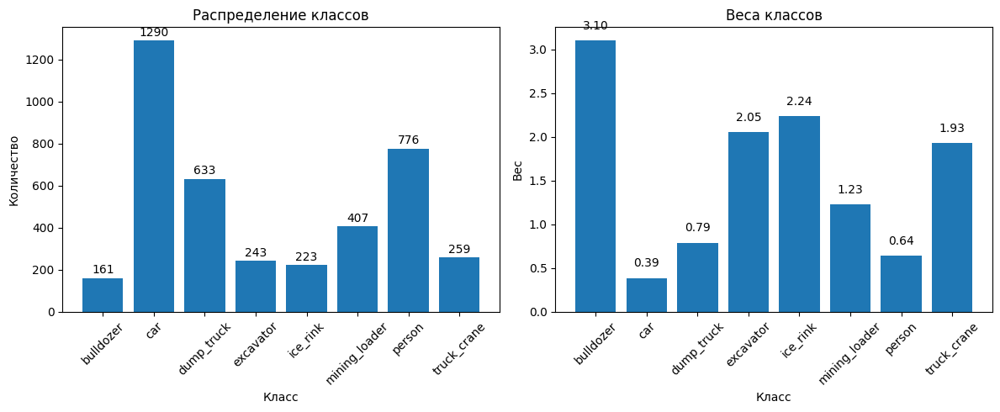

📊 РАСПРЕДЕЛЕНИЕ КЛАССОВ:
--------------------------------------------------
bulldozer       |  161 | вес: 3.10
car             | 1290 | вес: 0.39
dump_truck      |  633 | вес: 0.79
excavator       |  243 | вес: 2.05
ice_rink        |  223 | вес: 2.24
mining_loader   |  407 | вес: 1.23
person          |  776 | вес: 0.64
truck_crane     |  259 | вес: 1.93


In [6]:
# Рассчитывает веса классов из tf.data.Dataset

def get_class_weights_from_dataset(dataset, class_names):
    """
    Рассчитывает веса классов из tf.data.Dataset
    """
    # Собираем все метки
    all_labels = []
    for images, labels in dataset:
        all_labels.extend(labels.numpy())
    
    y_train = np.array(all_labels)
    
    # Расчет весов
    from sklearn.utils.class_weight import compute_class_weight
    class_weights = compute_class_weight(
        'balanced',
        classes=np.unique(y_train),
        y=y_train
    )
    
    weights_dict = dict(enumerate(class_weights))
    
    # Визуализация
    plt.figure(figsize=(12, 5))
    
    # График 1: Распределение классов
    plt.subplot(1, 2, 1)
    unique, counts = np.unique(y_train, return_counts=True)
    bars = plt.bar(range(len(unique)), counts)
    plt.title('Распределение классов')
    plt.xlabel('Класс')
    plt.ylabel('Количество')
    plt.xticks(range(len(unique)), [class_names[i] for i in unique], rotation=45)
    
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10, 
                str(count), ha='center', va='bottom')
    
    # График 2: Веса классов
    plt.subplot(1, 2, 2)
    bars = plt.bar(weights_dict.keys(), weights_dict.values())
    plt.title('Веса классов')
    plt.xlabel('Класс')
    plt.ylabel('Вес')
    plt.xticks(range(len(unique)), [class_names[i] for i in unique], rotation=45)
    
    for bar, weight in zip(bars, weights_dict.values()):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1, 
                f'{weight:.2f}', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()
    
    # Вывод информации
    print("📊 РАСПРЕДЕЛЕНИЕ КЛАССОВ:")
    print("-" * 50)
    for i, class_name in enumerate(class_names):
        count = counts[i] if i < len(counts) else 0
        weight = weights_dict.get(i, 0)
        print(f"{class_name:15} | {count:4} | вес: {weight:.2f}")
    
    return weights_dict

# ИСПОЛЬЗОВАНИЕ:
print("🎯 Расчет весов классов из тренировочных данных...")
class_weights = get_class_weights_from_dataset(train_data_raw, class_names)

🎲 АУГМЕНТИРОВАННЫЕ ИЗОБРАЖЕНИЯ ИЗ TRAIN_DATA:
Размер батча: (32, 224, 224, 3)
Количество изображений: 32


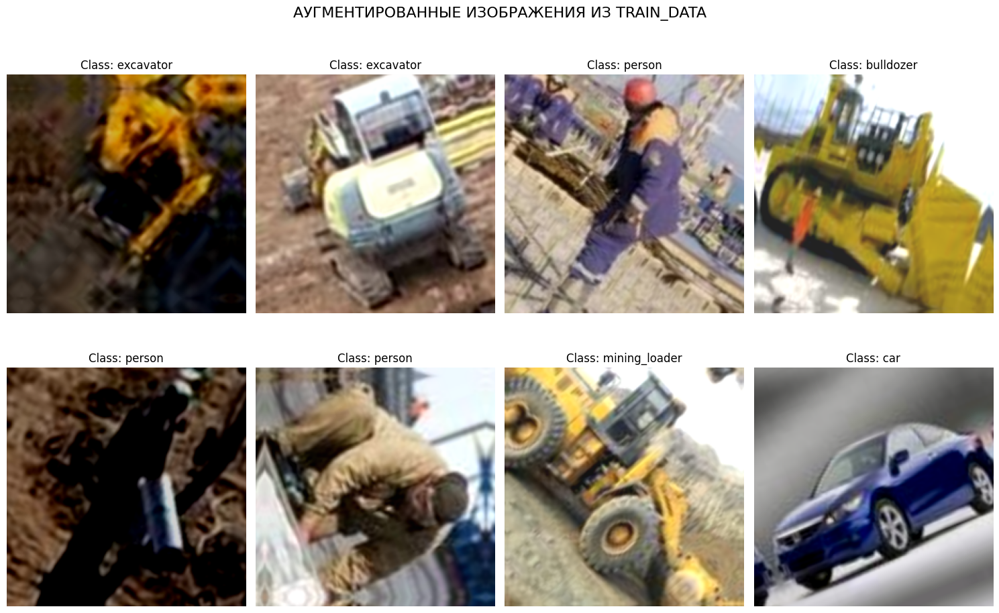

Диапазон данных в батче: 0.000 до 255.000


In [9]:
def show_augmented_batch():
    """Показывает аугментированные изображения из train_data"""
    # Берем один батч из train_data
    for images, labels in train_data.take(1):
        print(f"Размер батча: {images.shape}")  # (batch_size, height, width, channels)
        print(f"Количество изображений: {len(images)}")
        
        plt.figure(figsize=(15, 10))
        
        # Показываем первые 8 изображений из батча
        for i in range(min(8, len(images))):
            plt.subplot(2, 4, i+1)
            
            # Берем изображение из батча
            image = images[i]
            label = labels[i]
            
            # Денормализуем если нужно (из [0,1] в [0,255])
            if tf.reduce_max(image) <= 1.0:
                image = image * 255
            image = tf.cast(image, tf.uint8)
            
            plt.imshow(image)
            plt.title(f'Class: {class_names[label.numpy()]}')
            plt.axis('off')
        
        plt.suptitle('АУГМЕНТИРОВАННЫЕ ИЗОБРАЖЕНИЯ ИЗ TRAIN_DATA', fontsize=16)
        plt.tight_layout()
        plt.show()
        
        # Проверяем диапазон данных
        print(f"Диапазон данных в батче: {tf.reduce_min(images):.3f} до {tf.reduce_max(images):.3f}")
        break

# Запускаем
print("🎲 АУГМЕНТИРОВАННЫЕ ИЗОБРАЖЕНИЯ ИЗ TRAIN_DATA:")
show_augmented_batch()

🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):
📊 Распределение в тренировочных данных:


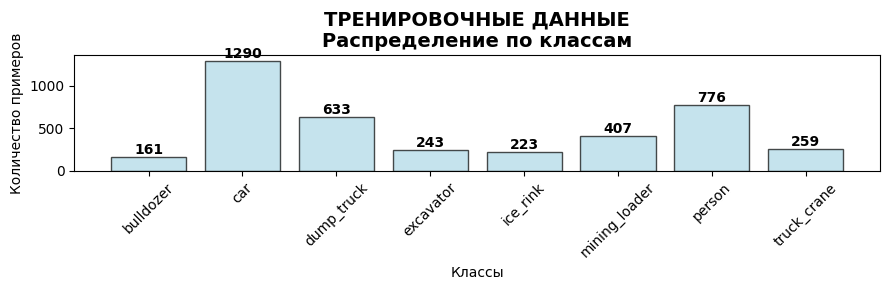

📊 Распределение в валидационных данных:


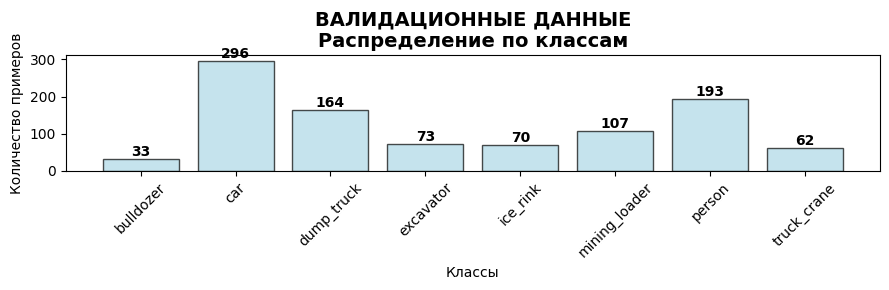


🖼️ По одному примеру на класс (тренировка):


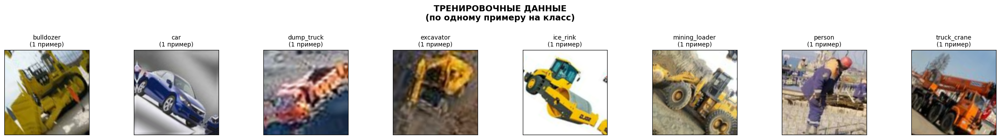


🖼️ По одному примеру на класс (валидация):


2025-10-19 18:49:32.898035: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


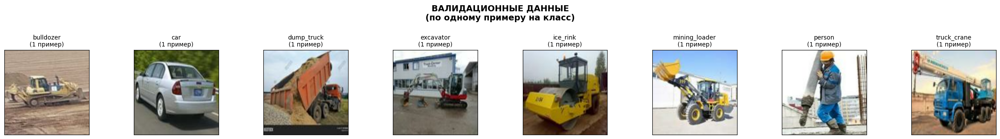

In [15]:
def visualize_single_example_per_class(dataset, class_names, title=""):
    """
    Визуализация по одному примеру для каждого класса
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset.take(10):  # Берем несколько батчей
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Создаем сетку для визуализации
    cols = len(class_names)
    fig, axes = plt.subplots(1, cols, figsize=(3*cols, 3))
    
    if cols == 1:
        axes = [axes]
    
    fig.suptitle(f'{title}\n(по одному примеру на класс)', fontsize=14, fontweight='bold', y=1.05)
    
    for class_idx, class_name in enumerate(class_names):
        ax = axes[class_idx]
        
        # Находим первый пример этого класса
        class_mask = all_labels == class_idx
        class_examples = all_images[class_mask]
        
        if len(class_examples) > 0:
            # Берем первый пример класса
            image = class_examples[0].copy()
            
            # Восстанавливаем оригинальные цвета
            image[..., 0] += 103.939  # B
            image[..., 1] += 116.779  # G
            image[..., 2] += 123.68   # R
            image = np.clip(image, 0, 255).astype('uint8')
            image = image[..., ::-1]  # BGR → RGB
            
            ax.imshow(image)
            ax.set_title(f'{class_name}\n(1 пример)', fontsize=10)
        else:
            ax.imshow(np.zeros((224, 224, 3)))
            ax.set_title(f'{class_name}\n(нет примеров)', fontsize=10)
            ax.text(0.5, 0.5, 'Нет примеров', 
                   ha='center', va='center', 
                   transform=ax.transAxes, fontsize=8)
        
        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(False)
    
    plt.tight_layout()
    plt.show()

# БЫСТРАЯ версия распределения
def visualize_class_distribution_simple(dataset, class_names, title=""):
    """
    Упрощенная визуализация распределения классов
    """
    # Считаем количество примеров по классам
    class_counts = {name: 0 for name in class_names}
    
    for images, labels in dataset:
        for label in labels.numpy():
            class_counts[class_names[label]] += 1
    
    # Визуализация
    plt.figure(figsize=(9, 3))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    bars = plt.bar(classes, counts, color='lightblue', edgecolor='black', alpha=0.7)
    plt.title(f'{title}\nРаспределение по классам', fontsize=14, fontweight='bold')
    plt.xlabel('Классы')
    plt.ylabel('Количество примеров')
    plt.xticks(rotation=45)
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                f'{count}', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    return class_counts

# Тестируем упрощенную версию
print("🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):")
print("📊 Распределение в тренировочных данных:")
train_counts = visualize_class_distribution_simple(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("📊 Распределение в валидационных данных:")
val_counts = visualize_class_distribution_simple(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (тренировка):")
visualize_single_example_per_class(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (валидация):")
visualize_single_example_per_class(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

In [8]:
# 2. Optuna (Bayesian Optimization)

import optuna
from optuna.integration import TFKerasPruningCallback
import tensorflow as tf
#--------------------------------------------------------------------------------------------------------------------
from tensorflow.keras.applications import ResNet50, EfficientNetV2S, EfficientNetV2B0, EfficientNetB0, EfficientNetV2M, EfficientNetV2L
# from tensorflow.keras.applications import (
#     ResNet50,
#     EfficientNetV2S, EfficientNetV2B0, EfficientNetV2B1, EfficientNetV2B2, 
#     EfficientNetV2B3, EfficientNetV2L, EfficientNetV2M, EfficientNetV2XL
# )
#from convnext import ConvNeXtTiny, ConvNeXtSmall, ConvNeXtBase, ConvNeXtLarge, ConvNeXtXLarge

#-----------------------------------------------------------------------------------------------------------------------
from tensorflow.keras import layers, Model
from tensorflow.keras.layers import (GlobalAveragePooling2D, GlobalMaxPooling2D, Dense, Dropout, BatchNormalization, Activation, Concatenate, Add)
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['TF_XLA_FLAGS'] = '--tf_xla_auto_jit=0'
tf.get_logger().setLevel('ERROR')

# 🔧 СЛОВАРЬ MODELS:
MODELS = {
    # EfficientNetV2 Family (рекомендуется)
    # 'EfficientNetV2B0': EfficientNetV2B0,
    # 'EfficientNetV2B1': EfficientNetV2B1, 
    # 'EfficientNetV2B2': EfficientNetV2B2,
    # 'EfficientNetV2B3': EfficientNetV2B3,
    'EfficientNetV2S': EfficientNetV2S,
    'EfficientNetV2M': EfficientNetV2M, 
    'EfficientNetV2L': EfficientNetV2L,
    # 'EfficientNetV2XL': EfficientNetV2XL,
   
    # ResNet Family  
    'ResNet50': ResNet50,
    # 'ResNeXt50': ResNeXt50,

    #   print("⚠️ ConvNeXt не установлен. Для установки: pip install convnext-tensorflow")
    # ConvNeXt Family
    # 'ConvNeXtTiny': ConvNeXtTiny,
    # 'ConvNeXtSmall': ConvNeXtSmall,
    # 'ConvNeXtBase': ConvNeXtBase, 
    # 'ConvNeXtLarge': ConvNeXtLarge,
    # 'ConvNeXtXLarge': ConvNeXtXLarge,
}


# =============================================================================
# 🔧 ПРЕДВАРИТЕЛЬНЫЕ НАСТРОЙКИ (ДОЛЖНЫ БЫТЬ ОПРЕДЕЛЕНЫ!)
# =============================================================================

# 🎯 ЗАДАЙТЕ ЭТИ ПЕРЕМЕННЫЕ ПЕРЕД ЗАПУСКОМ:

model_name = 'EfficientNetV2S'  # Или 'EfficientNetV2S' и т.д.
n_trials = 20

height, width = 224, 224


def residual_block(x, units, dropout_rate=0.5, l2_reg=1e-5, activation='relu'):
    """Оптимизированный residual block для небольших датасетов"""
    
    # Основной путь
    x = Dense(units, kernel_regularizer=l2(l2_reg))(x)
    x = BatchNormalization()(x)
    x = Activation(activation)(x)
    x = Dropout(dropout_rate)(x)
    
    return x

def create_optuna_model(trial):
    """Создает модель с параметрами которые предлагает Optuna"""
    
    # 1. Optuna предлагает параметры для тестирования
    #units_1 = trial.suggest_categorical('units_1', [256, 512])
    units_2 = trial.suggest_categorical('units_2', [128, 256]) 
    units_3 = trial.suggest_categorical('units_3', [64, 128])
    #dropout_1 = trial.suggest_categorical('dropout_1', [0.6, 0.7, 0.8])
    dropout_2 = trial.suggest_categorical('dropout_2', [0.4, 0.5, 0.6])
    dropout_3 = trial.suggest_categorical('dropout_3', [0.2, 0.3, 0.4])
    l2_reg = trial.suggest_categorical('l2_reg', [1e-5, 1e-5, 1e-4, 1e-3])
    learning_rate = trial.suggest_categorical('learning_rate', [1e-5,1e-5, 1e-4, 1e-3])
    activation = trial.suggest_categorical('activation', ['relu', 'elu', 'selu'])

    # 2. ВХОД И БАЗОВАЯ МОДЕЛЬ
    inputs = tf.keras.Input(shape=(height, width, 3))
    
    base_model = MODELS[model_name](
        weights='imagenet',
        include_top=False,
        input_shape=(height, width, 3)
    )
    base_model.trainable = False
    x = base_model(inputs, training=False)
    '''
    # 98-40
    # 3. КЛАССИФИКАТОР С ДВОЙНЫМ POOLING
    gap = GlobalAveragePooling2D()(x)
    gmp = GlobalMaxPooling2D()(x)
    x = Concatenate()([gap, gmp])
    x = BatchNormalization()(x)
    # 4. РЕЗИДУАЛЬНЫЕ БЛОКИ (ПЕРЕДАЕМ ВСЕ ПАРАМЕТРЫ)
    #x = residual_block(x, units_1, dropout_1, l2_reg, activation)
    x = residual_block(x, units_2, dropout_2, l2_reg, activation) 
    x = residual_block(x, units_3, dropout_3, l2_reg, activation)
    '''
    # 3. КЛАССИФИКАТОР С ДВОЙНЫМ POOLING
    #gap = GlobalAveragePooling2D()(x)
    #x = GlobalMaxPooling2D()(x)
    x = GlobalAveragePooling2D()(x)
    
    #x = BatchNormalization()(x)
    # 4. РЕЗИДУАЛЬНЫЕ БЛОКИ (ПЕРЕДАЕМ ВСЕ ПАРАМЕТРЫ)
    #x = residual_block(x, units_1, dropout_1, l2_reg, activation)
    x = residual_block(x, units_2, dropout_2, l2_reg, activation) 
    x = residual_block(x, units_3, dropout_3, l2_reg, activation)
#==================================================================================================
    # x = layers.GlobalAveragePooling2D()(x)
    # x = layers.BatchNormalization()(x)  # ⬅️ Добавляем BatchNorm
    # x = layers.Dense(units_1, activation)(x)
    # x = layers.BatchNormalization()(x)
    # x = layers.Dropout(dropout_2)(x)
    # x = layers.Dense(units_1, activation)(x) 
    # x = layers.BatchNormalization()(x)
    # x = layers.Dropout(dropout_3)(x)
#==================================================================================================
    
    # 5. ВЫХОДНОЙ СЛОЙ
    outputs = Dense(num_classes, activation='softmax')(x)

    
    # 6. СОБИРАЕМ И КОМПИЛИРУЕМ МОДЕЛЬ
    model = Model(inputs, outputs)
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    
    return model

# =============================================================================
# 🎯 ФУНКЦИЯ OPTIMIZATION
# =============================================================================

def objective(trial):
    """Целевая функция для Optuna"""
    
    model = create_optuna_model(trial)
    
    history = model.fit(
        train_data,
        epochs=15,
        validation_data=validation_data,
        verbose=1,
        callbacks=[
            EarlyStopping(
                monitor='val_accuracy',
                patience=15,
                restore_best_weights=True,
                verbose=1
            ),
            TFKerasPruningCallback(trial, 'val_accuracy')
        ]
    )
    
    best_val_accuracy = max(history.history['val_accuracy'])
    return best_val_accuracy

# =============================================================================
# 🚀 ЗАПУСК ОПТИМИЗАЦИИ
# =============================================================================

print("🚀 ЗАПУСК OPTUNA OPTIMIZATION...")

study = optuna.create_study(
    direction='maximize',
    study_name='EfficientNetV2S_MINI_4',
    storage='sqlite:///my_optuna_study.db',
    load_if_exists=True
)

study.optimize(objective, n_trials=n_trials)

print("\n🎯 OPTUNA ОПТИМИЗАЦИЯ ЗАВЕРШЕНА!")

# РЕЗУЛЬТАТЫ
print(f"\n🏆 ЛУЧШИЕ ПАРАМЕТРЫ:")
print(f"  Accuracy: {study.best_value:.4f}")
print("  Параметры:")
for key, value in study.best_params.items():
    print(f"    {key}: {value}")

# ФИНАЛЬНАЯ МОДЕЛЬ
print("\n🔧 СОЗДАЕМ ФИНАЛЬНУЮ НЕ ОБУЧЕННУЮ МОДЕЛЬ...")
best_model = create_optuna_model(study.best_trial)
best_model.summary()

# Сохраняем текущую модель
best_model.save('model_optuna_best_params.keras')
print("💾 Модель сохранена как 'model_optuna_best_params.keras'")

# ВСТРОЕННЫЕ ВИЗУАЛИЗАЦИИ OPTUNA
print("\n📈 ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ...")

# 1. График оптимизации
fig1 = optuna.visualization.plot_optimization_history(study)
fig1.show()

# 2. Важность параметров
fig2 = optuna.visualization.plot_param_importances(study)
fig2.show()

# 3. Параллельные координаты
fig3 = optuna.visualization.plot_parallel_coordinate(study)
fig3.show()

# 4. Распределение параметров
fig4 = optuna.visualization.plot_contour(study)
fig4.show()

# 5. Сравнение распределений
fig5 = optuna.visualization.plot_slice(study)
fig5.show()

# 6. Timeline оптимизации
fig6 = optuna.visualization.plot_timeline(study)
fig6.show()

print("\n📊 ДЛЯ ПРОСМОТРА РЕЗУЛЬТАТОВ:")
print("В терминале выполни: optuna-dashboard sqlite:///my_optuna_study.db")

/home/oleg/miniconda3/envs/tensflow/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


🚀 ЗАПУСК OPTUNA OPTIMIZATION...


[I 2025-10-25 19:43:00,819] A new study created in RDB with name: EfficientNetV2S_MINI_4


Epoch 1/15


2025-10-25 19:43:10.774468: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-10-25 19:43:14.787971: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24487', 36 bytes spill stores, 44 bytes spill loads

2025-10-25 19:43:14.911371: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663_0', 464 bytes spill stores, 1372 bytes spill loads

2025-10-25 19:43:15.072160: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24487', 20 bytes spill stores, 20 bytes spill loads

2025-10-25 19:43:15.088853: I external/local_xla/xla/stream_executor/cuda/subprocess_co

123/125 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.3459 - loss: 2.0430

2025-10-25 19:43:41.696465: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 232 bytes spill stores, 232 bytes spill loads

2025-10-25 19:43:41.852845: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24487', 32 bytes spill stores, 32 bytes spill loads

2025-10-25 19:43:41.879517: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 5524 bytes spill stores, 5564 bytes spill loads

2025-10-25 19:43:41.880849: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 5352 bytes spill stores, 5352 bytes spill loads

2025-10-25 19:43:41.893233

125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - accuracy: 0.3479 - loss: 2.0365

2025-10-25 19:44:04.837043: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276', 12 bytes spill stores, 12 bytes spill loads

2025-10-25 19:44:04.973724: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276', 104 bytes spill stores, 104 bytes spill loads

2025-10-25 19:44:05.093250: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276_0', 176 bytes spill stores, 524 bytes spill loads

2025-10-25 19:44:05.169700: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276', 4760 bytes spill stores, 4760 bytes spill loads

2025-10-25 19:44:05.450670: I 

125/125 ━━━━━━━━━━━━━━━━━━━━ 74s 349ms/step - accuracy: 0.4727 - loss: 1.6332 - val_accuracy: 0.8477 - val_loss: 0.7545
Epoch 2/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.6949 - loss: 0.9623 - val_accuracy: 0.8958 - val_loss: 0.4826
Epoch 3/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.7618 - loss: 0.7777 - val_accuracy: 0.9108 - val_loss: 0.3741
Epoch 4/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.7968 - loss: 0.6754 - val_accuracy: 0.9198 - val_loss: 0.3328
Epoch 5/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8216 - loss: 0.6112 - val_accuracy: 0.9259 - val_loss: 0.3139
Epoch 6/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8392 - loss: 0.5688 - val_accuracy: 0.9339 - val_loss: 0.2895
Epoch 7/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8452 - loss: 0.5315 - val_accuracy: 0.9349 - val_loss: 0.2741
Epoch 8/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8622 - loss: 0.4866 - val_accuracy: 0.9

[I 2025-10-25 19:45:20,558] Trial 0 finished with value: 0.9498997926712036 and parameters: {'units_2': 256, 'units_3': 128, 'dropout_2': 0.5, 'dropout_3': 0.4, 'l2_reg': 0.0001, 'learning_rate': 0.0001, 'activation': 'elu'}. Best is trial 0 with value: 0.9498997926712036.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 44s 197ms/step - accuracy: 0.7445 - loss: 1.2965 - val_accuracy: 0.9188 - val_loss: 0.8121
Epoch 2/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.8592 - loss: 0.9561 - val_accuracy: 0.9259 - val_loss: 0.7260
Epoch 3/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.8838 - loss: 0.8380 - val_accuracy: 0.9399 - val_loss: 0.6680
Epoch 4/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.8955 - loss: 0.7651 - val_accuracy: 0.9419 - val_loss: 0.6131
Epoch 5/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9033 - loss: 0.7122 - val_accuracy: 0.9339 - val_loss: 0.6148
Epoch 6/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.9111 - loss: 0.6697 - val_accuracy: 0.9379 - val_loss: 0.5658
Epoch 7/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.9188 - loss: 0.6174 - val_accuracy: 0.9369 - val_loss: 0.5455
Epoch 8/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.9211 - loss: 0.5834 - val_ac

[I 2025-10-25 19:47:07,150] Trial 1 finished with value: 0.945891797542572 and parameters: {'units_2': 256, 'units_3': 64, 'dropout_2': 0.5, 'dropout_3': 0.3, 'l2_reg': 0.001, 'learning_rate': 0.001, 'activation': 'selu'}. Best is trial 0 with value: 0.9498997926712036.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 45s 208ms/step - accuracy: 0.1588 - loss: 3.0385 - val_accuracy: 0.2966 - val_loss: 2.5099
Epoch 2/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.2212 - loss: 2.7663 - val_accuracy: 0.4409 - val_loss: 2.2616
Epoch 3/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.2898 - loss: 2.5581 - val_accuracy: 0.5361 - val_loss: 2.0421
Epoch 4/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.3672 - loss: 2.3784 - val_accuracy: 0.6152 - val_loss: 1.8777
Epoch 5/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.4146 - loss: 2.2402 - val_accuracy: 0.6643 - val_loss: 1.7575
Epoch 6/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.4687 - loss: 2.1037 - val_accuracy: 0.6984 - val_loss: 1.6711
Epoch 7/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.5093 - loss: 2.0307 - val_accuracy: 0.7295 - val_loss: 1.5975
Epoch 8/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.5258 - loss: 1.9697 - val_ac

[I 2025-10-25 19:48:57,928] Trial 2 finished with value: 0.8136272430419922 and parameters: {'units_2': 256, 'units_3': 128, 'dropout_2': 0.5, 'dropout_3': 0.2, 'l2_reg': 0.001, 'learning_rate': 1e-05, 'activation': 'relu'}. Best is trial 0 with value: 0.9498997926712036.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 47s 220ms/step - accuracy: 0.7528 - loss: 0.7643 - val_accuracy: 0.9289 - val_loss: 0.2667
Epoch 2/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.8530 - loss: 0.4469 - val_accuracy: 0.9319 - val_loss: 0.2178
Epoch 3/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8833 - loss: 0.3672 - val_accuracy: 0.9339 - val_loss: 0.2012
Epoch 4/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.9003 - loss: 0.3237 - val_accuracy: 0.9419 - val_loss: 0.1828
Epoch 5/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.9098 - loss: 0.2837 - val_accuracy: 0.9459 - val_loss: 0.1720
Epoch 6/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.9198 - loss: 0.2481 - val_accuracy: 0.9379 - val_loss: 0.1936
Epoch 7/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.9251 - loss: 0.2328 - val_accuracy: 0.9359 - val_loss: 0.2006
Epoch 8/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.9316 - loss: 0.2040 - val_ac

[I 2025-10-25 19:50:47,429] Trial 3 finished with value: 0.9478957653045654 and parameters: {'units_2': 256, 'units_3': 128, 'dropout_2': 0.5, 'dropout_3': 0.3, 'l2_reg': 1e-05, 'learning_rate': 0.001, 'activation': 'selu'}. Best is trial 0 with value: 0.9498997926712036.


Epoch 1/15


2025-10-25 19:51:00.910571: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 204 bytes spill stores, 204 bytes spill loads

2025-10-25 19:51:00.915710: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24489', 20 bytes spill stores, 20 bytes spill loads

2025-10-25 19:51:01.053338: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663_0', 464 bytes spill stores, 1372 bytes spill loads

2025-10-25 19:51:01.218419: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24489', 32 bytes spill stores, 32 bytes spill loads

2025-10-25 19:51:01.347799: I

 91/125 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.2071 - loss: 2.4230

2025-10-25 19:51:17.319768: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 232 bytes spill stores, 232 bytes spill loads

2025-10-25 19:51:17.420281: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24489', 32 bytes spill stores, 32 bytes spill loads

2025-10-25 19:51:17.477267: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663_0', 404 bytes spill stores, 1288 bytes spill loads

2025-10-25 19:51:17.523528: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24489', 20 bytes spill stores, 20 bytes spill loads

2025-10-25 19:51:17.540670: I

125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - accuracy: 0.2458 - loss: 2.2853

2025-10-25 19:51:34.923998: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276', 12 bytes spill stores, 12 bytes spill loads

2025-10-25 19:51:35.078161: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276_0', 176 bytes spill stores, 524 bytes spill loads

2025-10-25 19:51:35.111994: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276', 104 bytes spill stores, 104 bytes spill loads

2025-10-25 19:51:35.312933: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276', 4760 bytes spill stores, 4760 bytes spill loads

2025-10-25 19:51:35.441251: I 

125/125 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.3750 - loss: 1.8447 - val_accuracy: 0.7896 - val_loss: 0.9030
Epoch 2/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.6330 - loss: 1.0941 - val_accuracy: 0.8617 - val_loss: 0.5688
Epoch 3/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.7039 - loss: 0.8909 - val_accuracy: 0.8988 - val_loss: 0.4252
Epoch 4/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.7430 - loss: 0.7892 - val_accuracy: 0.9108 - val_loss: 0.3626
Epoch 5/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.7673 - loss: 0.7225 - val_accuracy: 0.9188 - val_loss: 0.3187
Epoch 6/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8019 - loss: 0.6379 - val_accuracy: 0.9228 - val_loss: 0.2941
Epoch 7/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8044 - loss: 0.6046 - val_accuracy: 0.9319 - val_loss: 0.2675
Epoch 8/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8204 - loss: 0.5520 - val_accuracy: 0.9

[I 2025-10-25 19:52:42,256] Trial 4 finished with value: 0.9478957653045654 and parameters: {'units_2': 128, 'units_3': 128, 'dropout_2': 0.6, 'dropout_3': 0.3, 'l2_reg': 1e-05, 'learning_rate': 0.0001, 'activation': 'elu'}. Best is trial 0 with value: 0.9498997926712036.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - accuracy: 0.2188 - loss: 2.9530

[I 2025-10-25 19:53:28,296] Trial 5 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.5170 - loss: 1.4269

[I 2025-10-25 19:54:14,761] Trial 6 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - accuracy: 0.1488 - loss: 2.4624

[I 2025-10-25 19:55:03,793] Trial 7 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - accuracy: 0.1460 - loss: 2.6433

[I 2025-10-25 19:55:50,823] Trial 8 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.1573 - loss: 2.5688

[I 2025-10-25 19:56:36,419] Trial 9 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.1318 - loss: 2.8923

[I 2025-10-25 19:57:25,996] Trial 10 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.1336 - loss: 2.8865

[I 2025-10-25 19:58:10,815] Trial 11 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.1520 - loss: 2.9572

[I 2025-10-25 19:59:00,665] Trial 12 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.1930 - loss: 2.7789

[I 2025-10-25 19:59:45,445] Trial 13 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.0963 - loss: 2.7683

[I 2025-10-25 20:00:30,705] Trial 14 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - accuracy: 0.1098 - loss: 3.0848

[I 2025-10-25 20:01:21,476] Trial 15 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.1489 - loss: 2.7413

[I 2025-10-25 20:02:06,270] Trial 16 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - accuracy: 0.1917 - loss: 2.6284

[I 2025-10-25 20:02:54,601] Trial 17 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - accuracy: 0.1201 - loss: 2.7389

[I 2025-10-25 20:03:42,779] Trial 18 pruned. Trial was pruned at epoch 0.


Epoch 1/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.1588 - loss: 2.7240

[I 2025-10-25 20:04:28,642] Trial 19 pruned. Trial was pruned at epoch 0.



🎯 OPTUNA ОПТИМИЗАЦИЯ ЗАВЕРШЕНА!

🏆 ЛУЧШИЕ ПАРАМЕТРЫ:
  Accuracy: 0.9499
  Параметры:
    units_2: 256
    units_3: 128
    dropout_2: 0.5
    dropout_3: 0.4
    l2_reg: 0.0001
    learning_rate: 0.0001
    activation: elu

🔧 СОЗДАЕМ ФИНАЛЬНУЮ НЕ ОБУЧЕННУЮ МОДЕЛЬ...


Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_42 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-s (Functional)   │ (None, 7, 7, 1280)     │    20,331,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_20     │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_40          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_40 (Activation)      │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_40 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_41          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_41 (Activation)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_41 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 8)              │         1,032 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,694,760 (78.94 MB)

 Trainable params: 362,632 (1.38 MB)

 Non-trainable params: 20,332,128 (77.56 MB)

💾 Модель сохранена как 'model_optuna_best_params.keras'

📈 ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ...



📊 ДЛЯ ПРОСМОТРА РЕЗУЛЬТАТОВ:
В терминале выполни: optuna-dashboard sqlite:///my_optuna_study.db


In [ ]:
import optuna.visualization as vis

fig4 = vis.plot_contour(study)
fig4.show(renderer="browser")  # Открывает в браузере, где можно масштабировать

[W 2025-10-25 17:52:59,671] Your study does not have any completed trials.
gio: http://127.0.0.1:46445: Operation not supported


In [27]:
!optuna-dashboard sqlite:///my_optuna_study.db

Listening on http://127.0.0.1:8080/
Hit Ctrl-C to quit.

127.0.0.1 - - [19/Oct/2025 19:12:43] "GET / HTTP/1.1" 302 0
127.0.0.1 - - [19/Oct/2025 19:12:43] "GET /dashboard HTTP/1.1" 200 4145
127.0.0.1 - - [19/Oct/2025 19:12:43] "GET /static/bundle.js HTTP/1.1" 200 4140378
127.0.0.1 - - [19/Oct/2025 19:12:44] "GET /api/studies HTTP/1.1" 200 146
127.0.0.1 - - [19/Oct/2025 19:12:44] "GET /favicon.ico HTTP/1.1" 200 7670
127.0.0.1 - - [19/Oct/2025 19:12:46] "GET /api/meta HTTP/1.1" 200 63
/home/oleg/miniconda3/envs/TF/lib/python3.10/site-packages/optuna_dashboard/_importance.py:71: ExperimentalWarning: PedAnovaImportanceEvaluator is experimental (supported from v3.6.0). The interface can change in the future.
  study, target=target, evaluator=PedAnovaImportanceEvaluator()
/home/oleg/miniconda3/envs/TF/lib/python3.10/site-packages/optuna/importance/_ped_anova/evaluator.py:148: UserWarning: PedAnovaImportanceEvaluator computes the importances of params to achieve low `target` values. If this is

In [15]:
# Обучаем финальную модель дольше
# Полный код для вашего случая
import datetime
import os
from tensorflow.keras.callbacks import TensorBoard

best_model = tf.keras.models.load_model('model_optuna_best_params.keras')
# ОЦЕНКА НЕ ОБУЧЕННОЙ МОДЕЛИ
print(f"\n📊 ОЦЕНКА НЕ ОБУЧЕННОЙ  МОДЕЛИ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results[0], val_results[1]
print(f"✅ Результаты обученной модели:")
print(f"   - Validation Accuracy: {val_accuracy:.4f}")
print(f"   - Validation Loss: {val_loss:.4f}")

# 1. Создаем папку для логов
log_dir = os.path.join("logs", "fit", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
os.makedirs(log_dir, exist_ok=True)

# 2. Создаем callback
tensorboard_callback = TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,
    write_graph=True,
    write_images=False,  # Можно отключить для экономии места
    update_freq='epoch',
    profile_batch=0
)


final_history = best_model.fit(
    train_data,
    epochs=70,
    validation_data=validation_data,
    class_weight=class_weights,  # ← вот это если надо функция баланса классов class_weights
    callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True, verbose=1),
        tf.keras.callbacks.ModelCheckpoint(f'best_model-optuna_callback.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
        tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=7, factor=0.3, verbose=1),
        tensorboard_callback
    ],
    verbose=1
)


# ОЦЕНКА ОБУЧЕННОЙ МОДЕЛИ
print(f"\n📊 ОЦЕНКА ОБУЧЕННОЙ МОДЕЛИ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results[0], val_results[1]
print(f"✅ Результаты обученной модели:")
print(f"   - Validation Accuracy: {val_accuracy:.4f}")
print(f"   - Validation Loss: {val_loss:.4f}")

# 8. СОХРАНЕНИЕ РЕЗУЛЬТАТОВ
# Сохраняем модель
best_model.save('best_optuna_model.keras')
print("💾 Модель сохранена как 'best_optuna_model.keras'")

'''
loaded_model.summary()

# 5. После обучения запускаем TensorBoard
print("\n🎯 Для просмотра TensorBoard выполните:")
print("!tensorboard --logdir logs/fit") tensorboard --logdir=logs/fit
print("И откройте http://localhost:6006/")
'''


/home/oleg/miniconda3/envs/tensflow/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:797: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 22 variables whereas the saved optimizer has 2 variables. 




📊 ОЦЕНКА НЕ ОБУЧЕННОЙ  МОДЕЛИ...
32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - accuracy: 0.1583 - loss: 2.1240
✅ Результаты обученной модели:
   - Validation Accuracy: 0.1583
   - Validation Loss: 2.1240
Epoch 1/70
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.2967 - loss: 2.2102
Epoch 1: val_accuracy improved from None to 0.84269, saving model to best_model-optuna_callback.keras
125/125 ━━━━━━━━━━━━━━━━━━━━ 41s 171ms/step - accuracy: 0.4121 - loss: 1.8856 - val_accuracy: 0.8427 - val_loss: 0.8814 - learning_rate: 1.0000e-04
Epoch 2/70
124/125 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.6269 - loss: 1.2814
Epoch 2: val_accuracy improved from 0.84269 to 0.89078, saving model to best_model-optuna_callback.keras
125/125 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6473 - loss: 1.2295 - val_accuracy: 0.8908 - val_loss: 0.5444 - learning_rate: 1.0000e-04
Epoch 3/70
124/125 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.7154 - loss: 1.0107
Epoch 3: val_accuracy improved fro

'\nloaded_model.summary()\n\n# 5. После обучения запускаем TensorBoard\nprint("\n🎯 Для просмотра TensorBoard выполните:")\nprint("!tensorboard --logdir logs/fit") tensorboard --logdir=logs/fit\nprint("И откройте http://localhost:6006/")\n'

In [ ]:
!tensorboard --logdir logs/fit

/home/oleg/miniconda3/envs/TF/lib/python3.10/site-packages/tensorboard/default.py:30: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


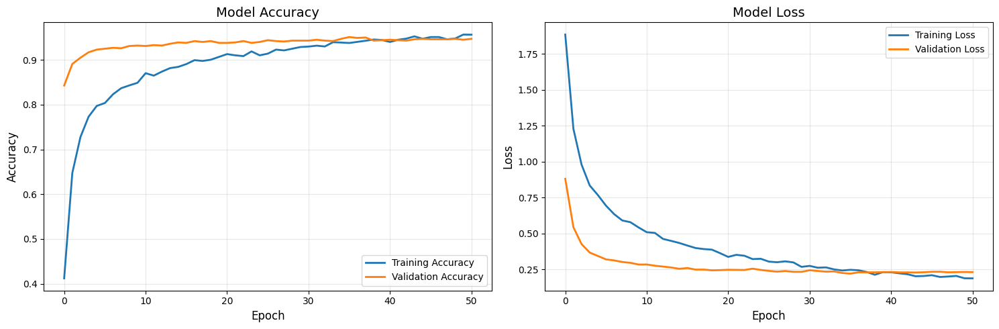

In [16]:
# Визуализация результатов

import matplotlib.pyplot as plt
import numpy as np

#history = final_history

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(final_history)


📊 ОЦЕНКА ЗАГРУЖЕННОЙ МОДЕЛИ...
32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - accuracy: 0.9509 - loss: 0.2212
✅ Результаты обученной модели:
   - Validation Accuracy: 0.9509
   - Validation Loss: 0.2212
💾 Модель сохранена как 'trained_model_optuna_{val_accuracy:.4f}'


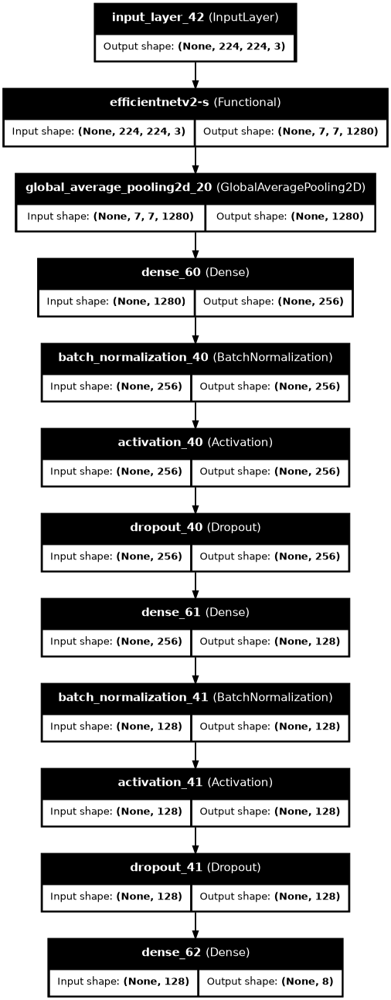

In [17]:
from tensorflow.keras.utils import plot_model
from PIL import Image

loaded_model = tf.keras.models.load_model('best_optuna_model.keras')
#loaded_model.summary()


# ОЦЕНКА ЗАГРУЖЕННОЙ МОДЕЛИ
print(f"\n📊 ОЦЕНКА ЗАГРУЖЕННОЙ МОДЕЛИ...")
val_results = loaded_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results[0], val_results[1]
print(f"✅ Результаты обученной модели:")
print(f"   - Validation Accuracy: {val_accuracy:.4f}")
print(f"   - Validation Loss: {val_loss:.4f}")

# 8. СОХРАНЕНИЕ РЕЗУЛЬТАТОВ
# Сохраняем модель
loaded_model.save(f'trained_model_optuna_{val_accuracy:.4f}.keras')
print("💾 Модель сохранена как 'trained_model_optuna_{val_accuracy:.4f}'")

plot_model(loaded_model, to_file=f'trained_model_optuna_{val_accuracy:.4f}.png', show_shapes=True, show_layer_names=True, dpi=66)
#display(Image.open('model_temp.png'))
#plot_model(loaded_model, to_file=f'best_optuna_model_{val_accuracy:.4f}.png')


🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...
📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...
🔄 Получаем предсказания...
🔄 Собираем предсказания и метки...
📦 Обработано батчей: 10
📦 Обработано батчей: 20
📦 Обработано батчей: 30
✅ Собрано 998 предсказаний
🔢 Уникальные истинные классы: [0 1 2 3 4 5 6 7]
🔢 Уникальные предсказанные классы: [0 1 2 3 4 5 6 7]
📋 Присутствующие классы: ['bulldozer', 'car', 'dump_truck', 'excavator', 'ice_rink', 'mining_loader', 'person', 'truck_crane']
📏 Confusion matrix shape: (8, 8)


2025-10-25 20:31:06.639017: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


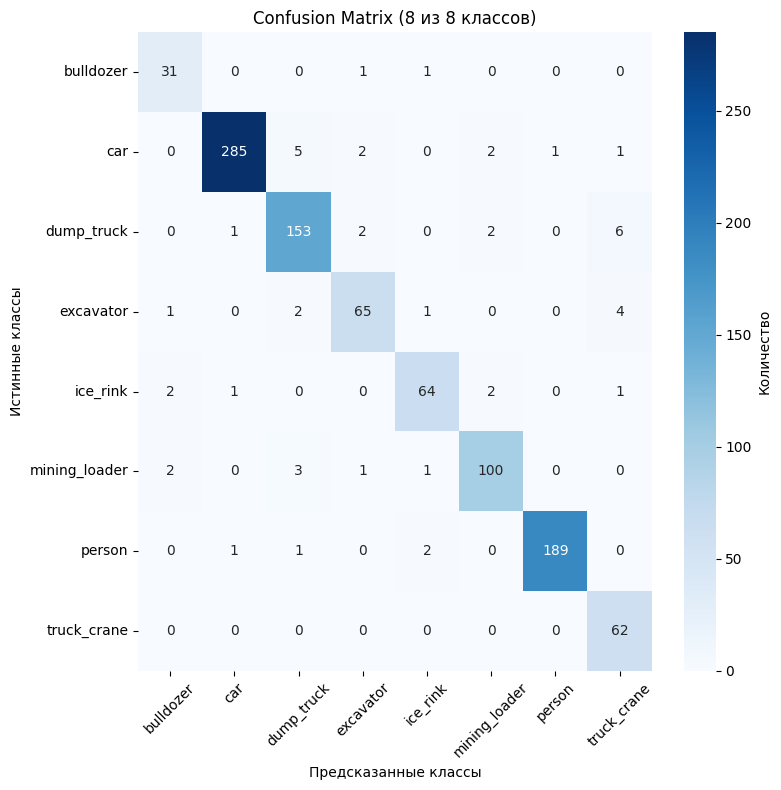


📈 ДЕТАЛЬНАЯ СТАТИСТИКА:
Всего примеров: 998
Общая точность: 0.9509

🎯 ТОЧНОСТЬ ПО КЛАССАМ:
  bulldozer: 0.9394 (31/33)
  car: 0.9628 (285/296)
  dump_truck: 0.9329 (153/164)
  excavator: 0.8904 (65/73)
  ice_rink: 0.9143 (64/70)
  mining_loader: 0.9346 (100/107)
  person: 0.9793 (189/193)
  truck_crane: 1.0000 (62/62)

📊 CLASSIFICATION REPORT:
               precision    recall  f1-score   support

    bulldozer     0.8611    0.9394    0.8986        33
          car     0.9896    0.9628    0.9760       296
   dump_truck     0.9329    0.9329    0.9329       164
    excavator     0.9155    0.8904    0.9028        73
     ice_rink     0.9275    0.9143    0.9209        70
mining_loader     0.9434    0.9346    0.9390       107
       person     0.9947    0.9793    0.9869       193
  truck_crane     0.8378    1.0000    0.9118        62

     accuracy                         0.9509       998
    macro avg     0.9253    0.9442    0.9336       998
 weighted avg     0.9529    0.9509    0.9513  

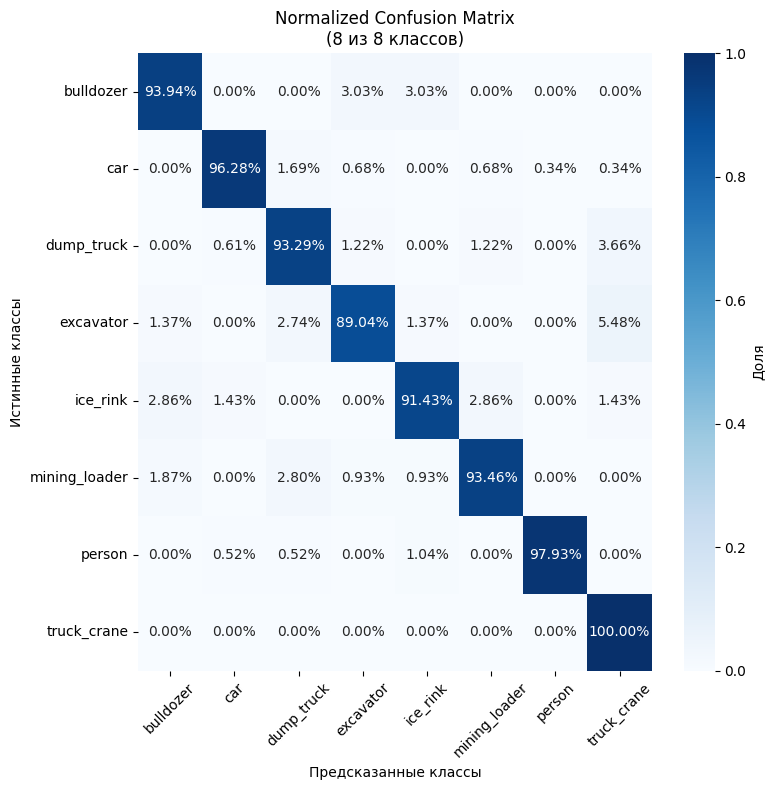

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf

history = final_history

'''
Синие тона:
cmap='Blues' # твой текущий
cmap='viridis' 
cmap='coolwarm'
cmap='icefire'

Зеленые тона:
cmap='Greens'
cmap='viridis'
cmap='summer'

Красные/оранжевые:
cmap='Reds'
cmap='Oranges'
cmap='YlOrBr'  
cmap='hot'

Фиолетовые:
cmap='Purples'
cmap='magma'
cmap='plasma'
'''


def get_all_predictions_modern(model, dataset):
    """Получает все предсказания и метки из датасета"""
    print("🔄 Собираем предсказания и метки...")
    
    all_preds = []
    all_true_labels = []
    
    # Проходим по всем батчам датасета
    for batch_idx, (images, labels) in enumerate(dataset):
        # Получаем предсказания для текущего батча
        batch_preds = model.predict(images, verbose=0)
        all_preds.append(batch_preds)
        all_true_labels.append(labels.numpy())
        
        # Прогресс каждые 10 батчей
        if (batch_idx + 1) % 10 == 0:
            print(f"📦 Обработано батчей: {batch_idx + 1}")
    
    # Объединяем все батчи
    all_preds = np.concatenate(all_preds, axis=0)
    all_true_labels = np.concatenate(all_true_labels, axis=0)
    
    print(f"✅ Собрано {len(all_preds)} предсказаний")
    return all_preds, all_true_labels

def safe_confusion_matrix_analysis(model, dataset, class_names):
    """Безопасный анализ confusion matrix с автоматической обработкой отсутствующих классов"""
    print("📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...")
    
    # Получаем предсказания
    print("🔄 Получаем предсказания...")
    preds, true_labels = get_all_predictions_modern(model, dataset)
    
    # Для sparse categorical - метки уже целые числа, не нужно argmax
    if len(true_labels.shape) == 1:  # sparse labels [0, 1, 2, ...]
        true_classes = true_labels
    else:  # one-hot encoded labels
        true_classes = np.argmax(true_labels, axis=1)
    
    preds_classes = np.argmax(preds, axis=1)
    
    # Находим какие классы реально присутствуют в данных
    present_true_classes = np.unique(true_classes)
    present_pred_classes = np.unique(preds_classes)
    
    print(f"🔢 Уникальные истинные классы: {present_true_classes}")
    print(f"🔢 Уникальные предсказанные классы: {present_pred_classes}")
    
    # Определяем какие классы из class_names реально присутствуют
    present_class_indices = sorted(present_true_classes)
    present_class_names = [class_names[i] for i in present_class_indices]
    
    print(f"📋 Присутствующие классы: {present_class_names}")
    
    absent_classes = [class_names[i] for i in range(len(class_names)) if i not in present_true_classes]
    if absent_classes:
        print(f"❌ Отсутствующие классы: {absent_classes}")
    
    # Создаем confusion matrix только для присутствующих классов
    cm = confusion_matrix(true_classes, preds_classes, labels=present_class_indices)
    
    print(f"📏 Confusion matrix shape: {cm.shape}")
    
    # Визуализируем
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Количество'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Confusion Matrix ({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    # Статистика
    total_samples = len(true_classes)
    accuracy = np.sum(preds_classes == true_classes) / total_samples
    
    print(f"\n📈 ДЕТАЛЬНАЯ СТАТИСТИКА:")
    print(f"Всего примеров: {total_samples}")
    print(f"Общая точность: {accuracy:.4f}")
    
    print(f"\n🎯 ТОЧНОСТЬ ПО КЛАССАМ:")
    for i, class_idx in enumerate(present_class_indices):
        class_name = class_names[class_idx]
        correct = cm[i, i]
        total = np.sum(cm[i, :])
        accuracy = correct / total if total > 0 else 0
        print(f"  {class_name}: {accuracy:.4f} ({correct}/{total})")
    
    # Для отсутствующих классов
    if absent_classes:
        print(f"\n❌ ОТСУТСТВУЮЩИЕ КЛАССЫ В ВАЛИДАЦИИ:")
        for class_name in absent_classes:
            print(f"  {class_name}: 0 примеров")
    
    # Classification report только для присутствующих классов
    print(f"\n📊 CLASSIFICATION REPORT:")
    print(classification_report(true_classes, preds_classes, 
                              labels=present_class_indices,
                              target_names=present_class_names, 
                              digits=4))
    
    # Нормализованная confusion matrix
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm_normalized = np.nan_to_num(cm_normalized)  # Заменяем NaN на 0
    
    sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Blues',
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Доля'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Normalized Confusion Matrix\n({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    return cm, present_class_names

# 🎯 ЗАПУСКАЕМ АНАЛИЗ
print("🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...")
cm, present_classes = safe_confusion_matrix_analysis(best_model, validation_data, class_names)

🎲 Тестирование случайных примеров...


2025-10-24 19:27:43.772397: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-10-24 19:27:44.682009: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot', 8 bytes spill stores, 8 bytes spill loads

2025-10-24 19:27:45.343854: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1', 4 bytes spill stores, 4 bytes spill loads

2025-10-24 19:27:45.404246: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2023', 16 bytes spill stores, 16 bytes spill loads



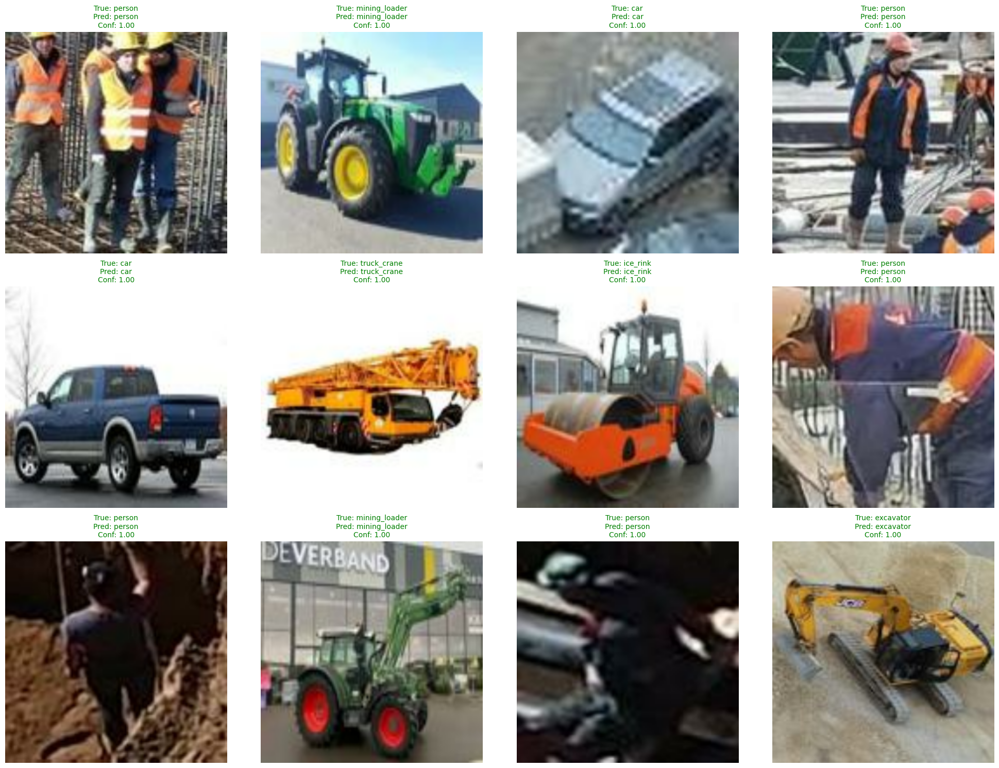

📊 Точность на 12 случайных примерах: 12/12 (100.0%)


In [13]:
# рандом ВЕРСИЯ ДЛЯ SPARSE LABELS 

def test_random_predictions_modern(model, dataset, class_names, num_samples=12):
    """
    Тестирование случайных примеров из всего датасета
    ВЕРСИЯ ДЛЯ SPARSE LABELS (целочисленные метки)
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    # Объединяем все батчи
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # ДЛЯ SPARSE LABELS - просто используем как есть, без argmax!
    true_classes = selected_labels  # ← ИСПРАВЛЕНИЕ ЗДЕСЬ
    
    # Создаем сетку
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    elif rows > 1 and cols == 1:
        axes = axes.reshape(-1, 1)
    
    correct = 0
    for i, idx in enumerate(indices):
        if rows == 1:
            ax = axes[col] if cols > 1 else axes
        else:
            row_idx = i // cols
            col_idx = i % cols
            ax = axes[row_idx, col_idx]
        
        # Денормализация для ResNet50
        image = selected_images[i].copy()
        image[..., 0] += 103.939
        image[..., 1] += 116.779  
        image[..., 2] += 123.68
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        if rows == 1:
            if cols > 1:
                axes[i].axis('off')
        else:
            row_idx = i // cols
            col_idx = i % cols
            axes[row_idx, col_idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    
    return correct, accuracy

# Использование случайных примеров:
print("🎲 Тестирование случайных примеров...")
correct, accuracy = test_random_predictions_modern(best_model, validation_data, class_names, num_samples=12)

🎲 Тестирование случайных примеров (универсальная версия)...


2025-10-24 19:27:55.388711: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2023', 16 bytes spill stores, 16 bytes spill loads

2025-10-24 19:27:55.598919: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2023', 8 bytes spill stores, 8 bytes spill loads



🔍 Обнаружен формат меток: SPARSE


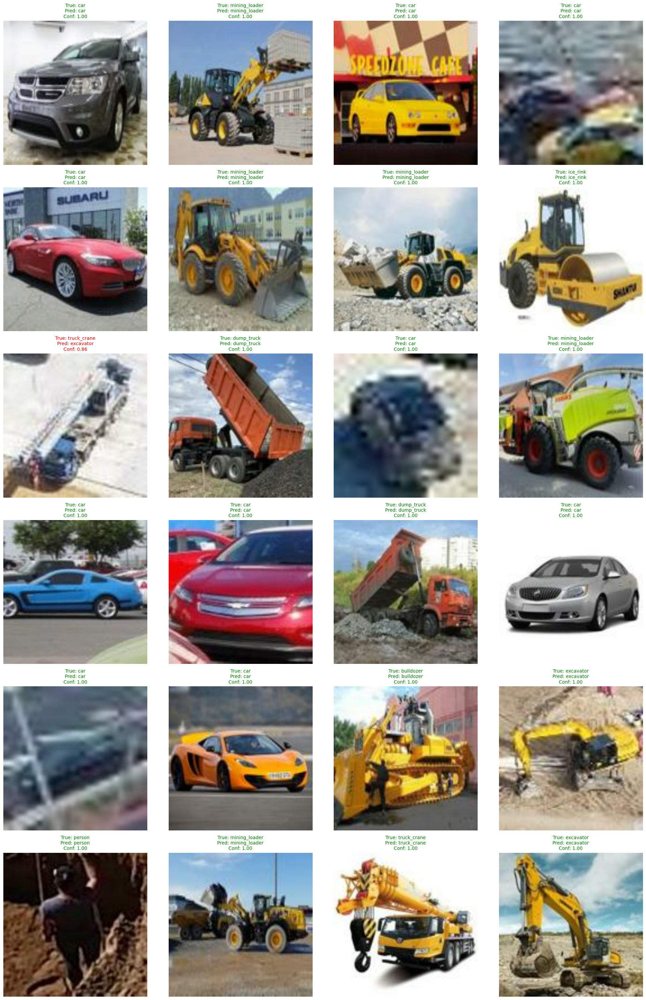

📊 Точность на 24 случайных примерах: 23/24 (95.8%)
🎯 Формат меток: SPARSE


In [14]:
# рандом УНИВЕРСАЛЬНАЯ ВЕРСИЯ (работает с любым форматом)

def test_random_predictions_universal(model, dataset, class_names, num_samples=12):
    """
    Универсальная версия для любого формата меток
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # АВТОМАТИЧЕСКОЕ ОПРЕДЕЛЕНИЕ ФОРМАТА МЕТОК
    if len(selected_labels.shape) == 1:  # SPARSE labels
        true_classes = selected_labels
        label_format = "SPARSE"
    else:  # ONE-HOT labels
        true_classes = np.argmax(selected_labels, axis=1)
        label_format = "ONE-HOT"
    
    print(f"🔍 Обнаружен формат меток: {label_format}")
    
    # Создаем сетку
    cols = 4
    rows = (len(indices) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    correct = 0
    for i, idx in enumerate(indices):
        row = i // cols
        col = i % cols
        ax = axes[row, col] if rows > 1 else axes[col]
        
        # Умная денормализация
        image = selected_images[i].copy()
        
        # Автоматическое определение диапазона
        if image.min() >= -1 and image.max() <= 1:
            image = (image + 1) * 127.5
        elif image.min() >= 0 and image.max() <= 1:
            image = image * 255
        else:
            # ImageNet нормализация
            image[..., 0] += 103.939
            image[..., 1] += 116.779  
            image[..., 2] += 123.68
        
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        row = i // cols
        col = i % cols
        if rows > 1:
            axes[row, col].axis('off')
        else:
            axes[col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    print(f"🎯 Формат меток: {label_format}")
    
    return correct, accuracy

# Тестируем универсальную версию
print("🎲 Тестирование случайных примеров (универсальная версия)...")
correct, accuracy = test_random_predictions_universal(best_model, validation_data, class_names, num_samples=24)

In [ ]:
# Сохраните модель

# Сохраняем обученную модель
model.save('cats_dogs_classifier.h5')
print("💾 Модель сохранена как 'cats_dogs_classifier.h5'")

# Или сохраняем только веса
model.save_weights('cats_dogs_weights.h5')
print("💾 Веса сохранены как 'cats_dogs_weights.h5'")

In [32]:
# Сохраняем в современном формате
model.save('best_model_scotp-2.keras')
print("💾 Модель сохранена как 'best_model_1.keras'")

💾 Модель сохранена как 'best_model_1.keras'
